In [2]:
# python2

from EmotionDetection import EmotionDetection
from collections import defaultdict
import plotly.plotly as py
import plotly.graph_objs as go
import os
import pytz
from datetime import datetime


## Read Patients

In [3]:
def readPatient(folder, filename):
    with open(folder + filename, 'r') as openfile:
        return [line.strip().split('\t') for line in openfile.readlines()]

In [4]:
def checkFolderFile(folder):
    return os.listdir(folder)

In [5]:
def readPatientIllTime(folder, filename):
    with open(folder + filename, 'r') as openfile:
        return [line.strip().split('\t') for line in openfile.readlines()]

In [6]:
def readPatientTimezone(folder, filename):
    time_dict = {}
    with open(folder + filename, 'r') as openfile:
        for line in openfile.readlines():
            split = line.strip().split('\t')
            if split[2] != None:
                time_dict[split[1][1:]] = split[2]
#             elif split[3]:
#                 time_dict[split[1][1:]] = split[3]
            else:
                continue
    return time_dict

In [7]:
folder = '../twitter crawler/patient_tweets/'
patient_list = checkFolderFile(folder)
# patient_tweets_list = []
patient_tweets_dict = defaultdict(lambda : [])
for patient_name in patient_list:
#     patient_tweets_list.append(readPatient(folder, patient_name))
    patient_tweets_dict[patient_name] = readPatient(folder, patient_name)


## Emotion Related

In [15]:
ed = EmotionDetection()


In [104]:
user_post_timeline = []

# list attribute
# username;date;retweets;favorites;text;geo;mentions;hashtags;id;permalink
for tweets in patient_tweets_list[9][:1500]:
    post_time = tweets[2]
    try:
        emotion_json = ed.get_emotion_json(tweets[3])
        if emotion_json[u'ambiguous'] == u'yes':
            post_emotion = 'ambiguous'
        else:
            post_emotion = emotion_json[u'groups'][0][u'name']

        user_post_timeline.append((post_time,post_emotion))
    except:
        continue
    
# print(user_post_timeline)

## Get patient timezone

In [8]:
patient_timezone_dict = readPatientTimezone('../twitter crawler/','bipolar_user_timezone')

In [9]:
patient_timezone_dict['_raspberries']

'Pacific Time (US & Canada)'

## Set Patient Timezone

In [10]:
timezone_location_dict = {
    'Pacific Time (US & Canada)':'US/Pacific',
    'Central Time (US & Canada)':'US/Central',
    'Eastern Time (US & Canada)':'US/Eastern',
    'London':'Europe/London',
    'Sydney':'Australia/Sydney',
    'Tokyo':'Asia/Tokyo',
    'Africa/Nairobi':'Africa/Nairobi',
    'Arizona':'US/Arizona',
    'Kyiv':'Europe/Simferopol',
    'Europe/London':'Europe/London',
    'Atlantic Time (Canada)':'Atlantic/Canary',
    'Midway Island':'Pacific/Apia',
    'Auckland':'Pacific/Auckland',
    'Amsterdam':'Europe/Amsterdam',
    'Baghdad':'Asia/Riyadh',
    'Riyadh':'Asia/Riyadh',
    'Belgrade':'Europe/Belgrade',
    'Quito':'Pacific/Galapagos',
    'Pretoria':'Africa/Johannesburg',
    'Beijing':'Asia/Shanghai',
    'Dublin':'Europe/Dublin',
    'Mountain Time (US & Canada)':'Mountain/US',
    'Hawaii':'Pacific/Honolulu',
    'Brisbane':'Australia/Brisbane',
    'Vienna':'Europe/Vienna',
    'Islamabad':'Asia/Karachi',
    'Casablanca':'Africa/Casablanca',
    'Yakutsk':'Asia/Yakutsk',
    'Tijuana':'America/Tijuana',
    'Africa/Johannesburg':'Africa/Johannesburg',
    'Mountain Time (US & Canada)':'US/Central'
    
}

In [11]:
def to_local_timezone(local, orig_time):
    dt = datetime.strptime(orig_time, "%Y-%m-%d %H:%M:%S")
    dt = pytz.timezone(local).localize(dt)
    est_dt = dt.astimezone(pytz.timezone('EST'))

#     print est_dt.strftime("%Y-%m-%d %H:%M:%S")
    return est_dt.strftime("%Y-%m-%d %H:%M:%S")

In [12]:
to_local_timezone('Atlantic/Canary',"2016-5-10 19:53:5")


'2016-05-10 13:53:05'

In [12]:

# for user in patient_timezone_dict:
#     timezone = patient_timezone_dict[user]
#     if timezone == 'None': continue
# #     try:
#     local = (timezone_location_dict[patient_timezone_dict[user]])
# #     print(local)
#     print(to_local_timezone(local,"2016-5-10 19:53:5"))
#     except:
#         print('\n')
#         print(patient_timezone_dict[user])
#         print('\n')

## Get ill time information

In [13]:
patient_ill_time_list = readPatientIllTime('../twitter crawler/', 'bipolar_list')
#patient_ill_time_list[50:56]
patient_ill_time_dict = {line[0]: line[1] for line in patient_ill_time_list}

### Seperate time to monthly and yearly dict

In [14]:
patient_month_time_dict = {}
patient_year_time_dict ={}

for patient in patient_ill_time_dict:
    if len(patient_ill_time_dict[patient].split('/')) > 1:
        patient_month_time_dict[patient] = patient_ill_time_dict[patient]
    else:
        patient_year_time_dict[patient] = patient_ill_time_dict[patient]

# Analyse the post frequence

## By Day

In [15]:
# patient_name -> date time -> tweets
patient_day_tweets = defaultdict(lambda: defaultdict(lambda: []))
for patient in patient_tweets_dict:
    try:
        local = timezone_location_dict[patient_timezone_dict[patient]]
    except:
        continue
        
    for tweet in patient_tweets_dict[patient]:
        local_time = to_local_timezone(local,tweet[2])
        date, time = local_time.split(' ')
        date = int(date.replace('-',''))  
        try:
            patient_day_tweets[patient][date].append(tweet[2] + '\t' +tweet[3])
        except:
            patient_day_tweets[patient][date].append(tweet[2] + '\t<empty_tweets>')
    

In [22]:
len(patient_day_tweets['_raspberries'])

554

In [23]:
patient_month_time_dict['_raspberries']

'2016/3/4'

## Chart

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import dates
import matplotlib
matplotlib.style.use('ggplot')

## Frequence

## Pandas

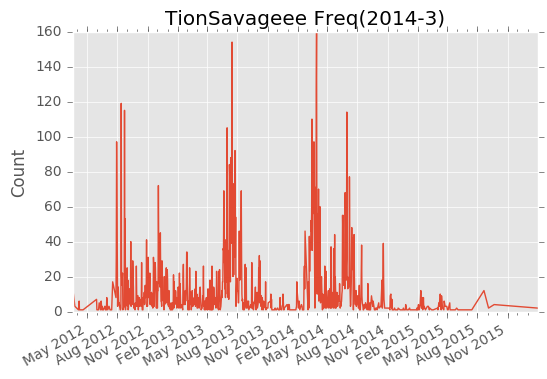

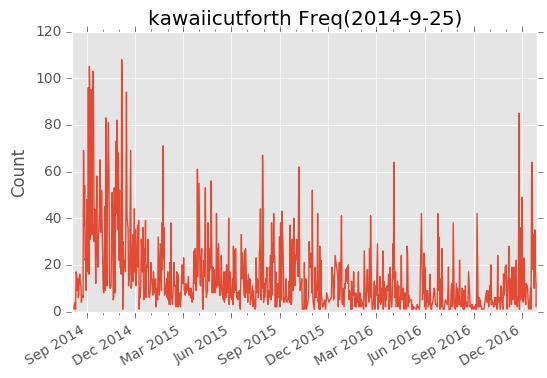

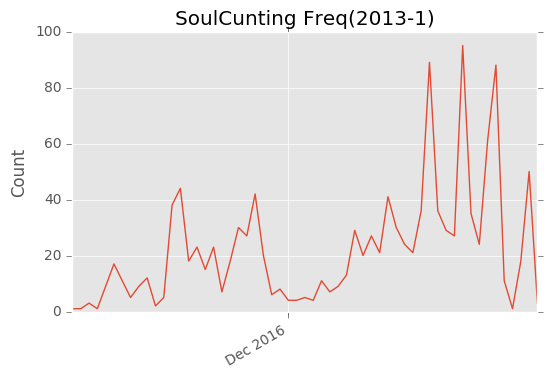

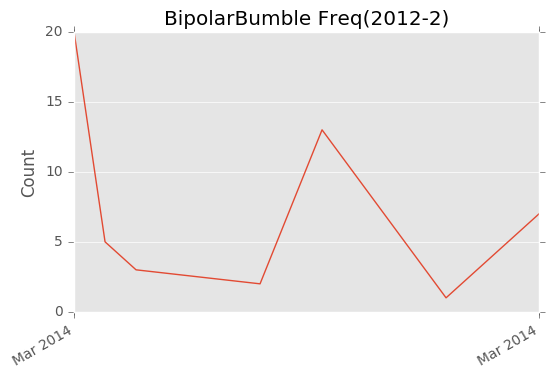

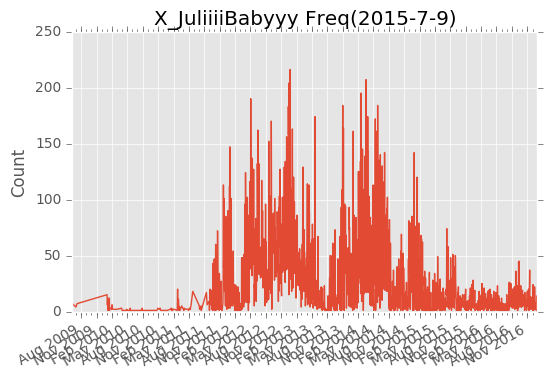

...

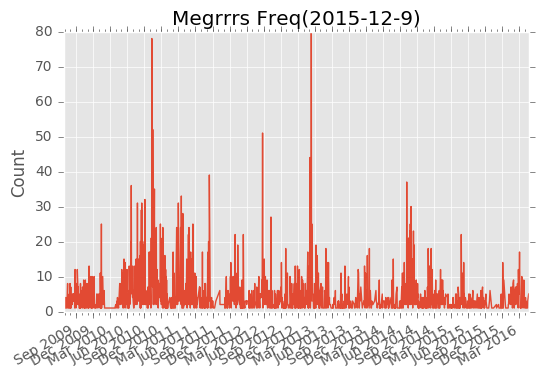

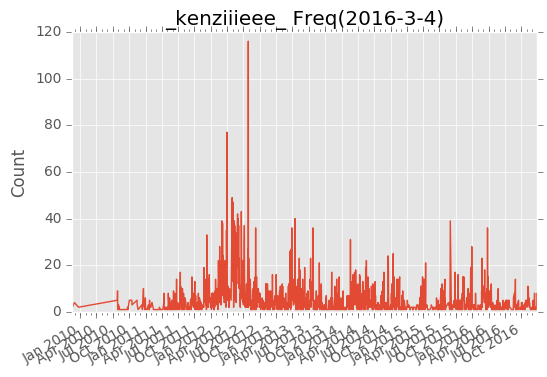

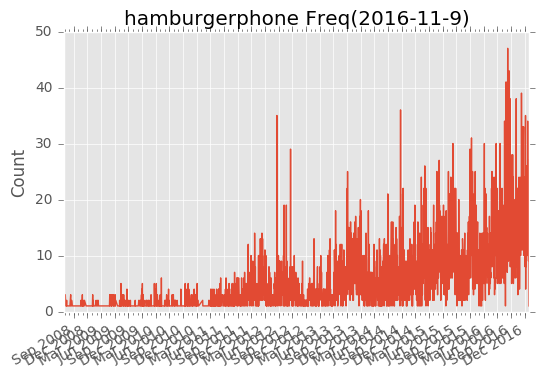

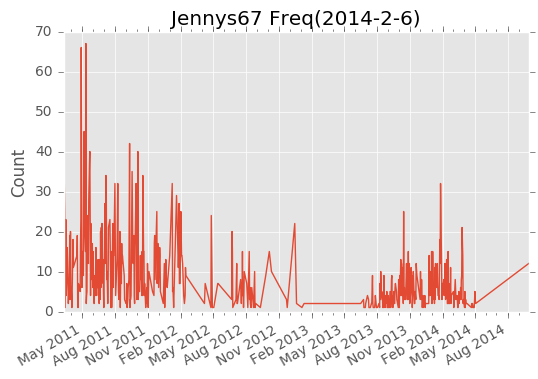

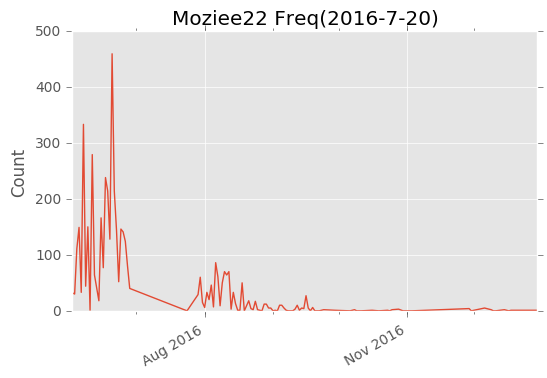

In [50]:

for patient in patient_day_tweets:
    x = []
    y = []
    try:
        ill_time = patient_month_time_dict[patient]
    except:
        continue
    
    for date_tweets in sorted(patient_day_tweets[patient]):
        y.append(len(patient_day_tweets[patient][date_tweets]))
        date_tweets = str(date_tweets)
        x.append(datetime(int(date_tweets[:4]),int(date_tweets[4:6]),int(date_tweets[6:])))

    dfmt = dates.DateFormatter('%b %Y')
        
        
    freq_fig = None
    freq_fig = pd.Series(y, index=x)
    figg = None
    figg = freq_fig.plot(title= patient + ' Freq' + '(' + ill_time.replace('/','-') + ')')
#     plt.xticks(np.arange(min(x), max(x)+1, 3))
    figg.set_ylabel('Count')
    month = dates.MonthLocator()
    two_month = dates.MonthLocator(interval=3)
    figg.xaxis.set_major_formatter(dfmt)
    figg.xaxis.set_major_locator(two_month)
    figg.xaxis.set_minor_locator(month)
    plt.show()
    
    fig = None
    fig = figg.get_figure()
    fig.set_size_inches(18.5, 10.5, forward=True)
    fig.savefig('patient figure/freq/' + patient + '.png', dpi=120)
    plt.close()

## Plotly

In [347]:
x_axis = []
y_axis = []

for date_tweets in sorted(patient_day_tweets['_raspberries']):
    y_axis.append(len(patient_day_tweets['_raspberries'][date_tweets]))
    date_tweets = str(date_tweets)
    x_axis.append(date_tweets[:4]+'-'+date_tweets[4:6]+'-'+date_tweets[6:])


In [351]:
data = [go.Scatter(
          x=x_axis,
          y=y_axis)]
py.iplot(data, filename= '_raspberries-freq'+ '(' + patient_month_time_dict['_raspberries'].replace('/','-')+')')
# '2016/3/4'

In [176]:
patient_day_tweets['_raspberries'][20160218]

["2016-02-18 23:32:01\t*wears full face of makeup so no one asks me where I've been for three weeks*"]

## Stay Late Analysis

## Pandas

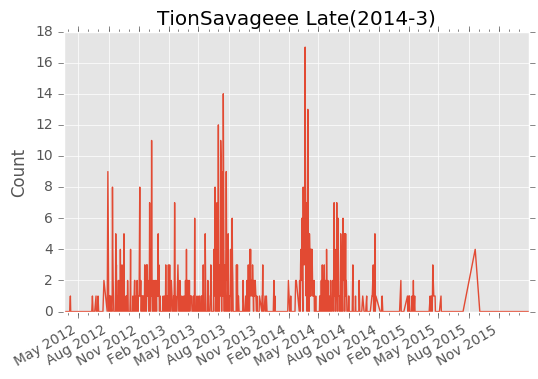

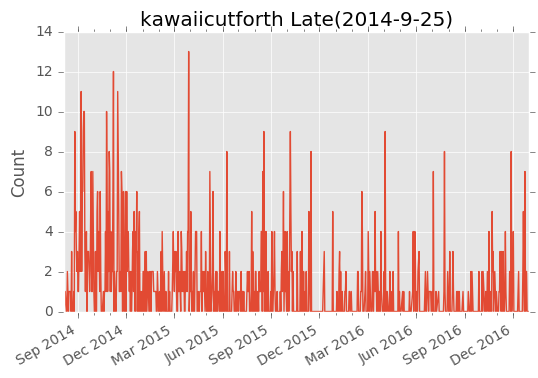

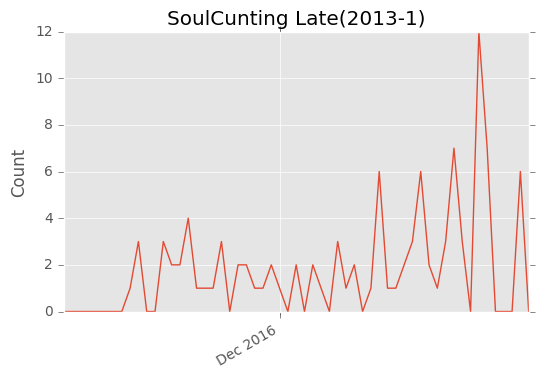

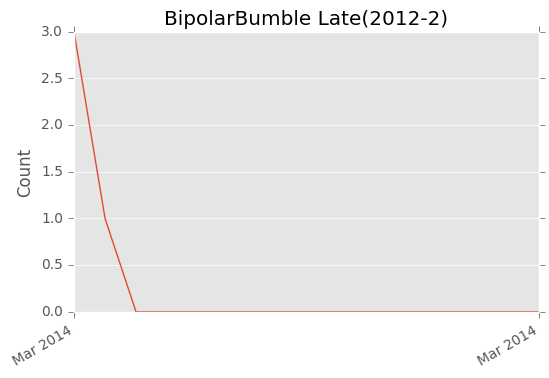

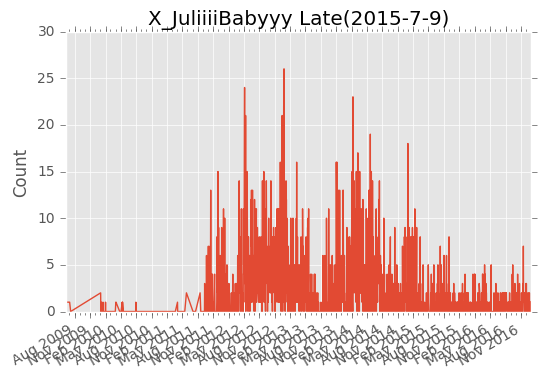

...

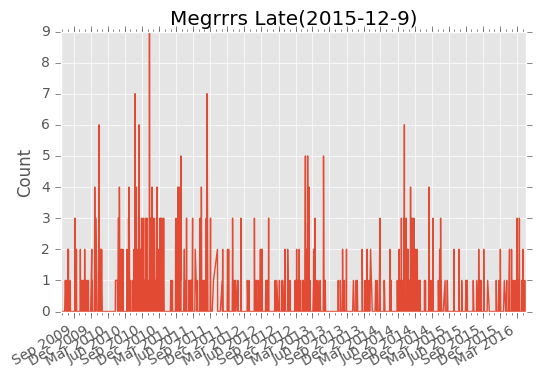

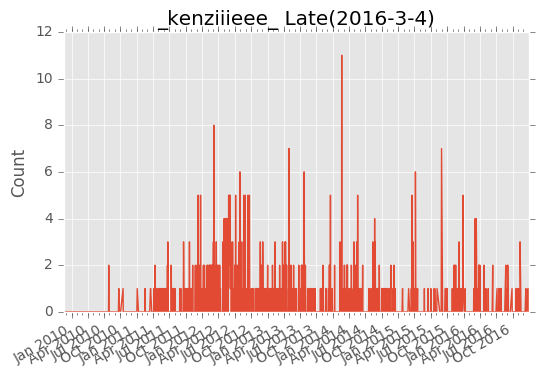

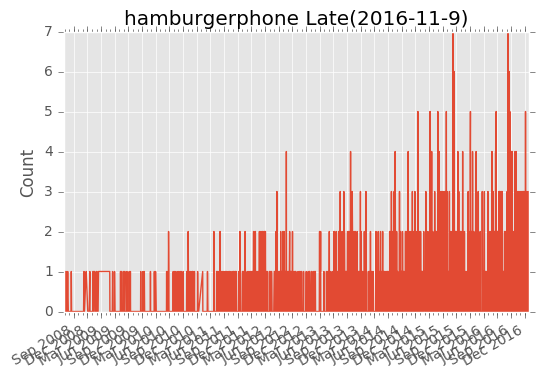

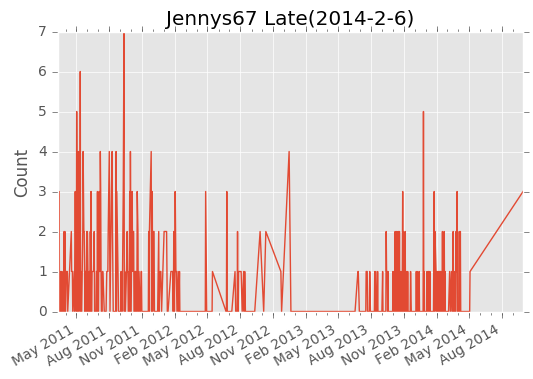

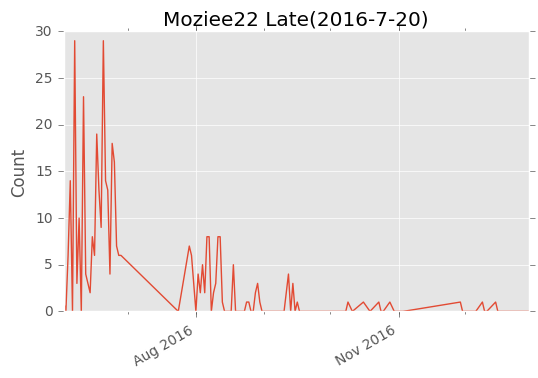

In [51]:
for patient in patient_day_tweets:
    lx_axis = []
    ly_axis = []
    try:
        local = timezone_location_dict[patient_timezone_dict[patient]]
        ill_time = patient_month_time_dict[patient]
    except:
        continue
    for date_tweets in sorted(patient_day_tweets[patient]):
        late_count = 0
        for tweets in patient_day_tweets[patient][date_tweets]:
            local_time = to_local_timezone(local,tweets.split('\t')[0])
            if int(local_time.split(' ')[1].split(':')[1]) < 5:
                late_count +=1
        ly_axis.append(late_count)
        date_tweets = str(date_tweets)
        lx_axis.append(datetime(int(date_tweets[:4]),int(date_tweets[4:6]),int(date_tweets[6:])))
    
    dfmt = dates.DateFormatter('%b %Y')
    
    late_fig = None
    late_fig = pd.Series(ly_axis, index=lx_axis)
    figg = None
    figg = late_fig.plot(title= patient + ' Late' + '(' + ill_time.replace('/','-') + ')')
    figg.set_ylabel('Count')
    month = dates.MonthLocator()
    two_month = dates.MonthLocator(interval=3)
    figg.xaxis.set_major_formatter(dfmt)
    figg.xaxis.set_major_locator(two_month)
    figg.xaxis.set_minor_locator(month)
    plt.show()
    fig = None
    fig = figg.get_figure()
    fig.set_size_inches(18.5, 10.5, forward=True)
    fig.savefig('patient figure/late/' + patient + '.png', dpi=120)
    plt.close()
#     break

## Plotly

In [356]:

for patient in patient_day_tweets:
    lx_axis = []
    ly_axis = []
    try:
        local = timezone_location_dict[patient_timezone_dict[patient]]
        ill_time = patient_month_time_dict[patient]
    except:
        continue
    for date_tweets in sorted(patient_day_tweets[patient]):
        late_count = 0
        for tweets in patient_day_tweets[patient][date_tweets]:
            local_time = to_local_timezone(local,tweets.split('\t')[0])
            if int(local_time.split(' ')[1].split(':')[1]) < 5:
                late_count +=1
        ly_axis.append(late_count)
        date_tweets = str(date_tweets)
        lx_axis.append(date_tweets[:4]+'-'+date_tweets[4:6]+'-'+date_tweets[6:])

    ldata = [go.Scatter(
              x=lx_axis,
              y=ly_axis)]
    py.iplot(ldata, filename= patient+ '-late(' +ill_time.replace('/','-') +')')
    

PlotlyError: Hey there! You've hit one of our API request limits. 

To get unlimited API calls(10,000/day), please upgrade to a paid plan. 

UPGRADE HERE: https://goo.gl/i7glmM 

Thanks for using Plotly! Happy Plotting!

# Old Data

In [42]:
emotion_degree_dict = {'joy':2,
                       'anticipation':1,
                       'trust':1,
                       'surprise':1,
                       'ambiguous':0,
                       'fear':-1,
                       'anger':-2,
                       'disgust':-1,
                       'sadness':-1 
                      }

In [105]:
x_axis = []
y_axis = []

for post in user_post_timeline:
    x_axis.append(post[0])
    y_axis.append(emotion_degree_dict[post[1]])

In [106]:
data = [go.Scatter(
          x=x_axis,
          y=y_axis)]
py.iplot(data, filename= patient_name)
# 2016/8/30